<a href="https://colab.research.google.com/github/Ekoeden/Intelligent-Computing-Systems/blob/main/lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ANFIS

In [ ]:
"""
MyAnfis Implementation
Gregor Lenhard
University of Basel
"""
import logging
logging.getLogger('tensorflow').disabled = True
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # remove WARNING Messages
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
# parameter class fis parameters


class fis_parameters():
    def __init__(self, n_input: int = 3, n_memb: int = 3, batch_size: int = 16, n_epochs: int = 25, memb_func: str = 'gaussian', optimizer: str = 'sgd', loss: str = 'mse'):
        self.n_input = n_input  # no. of Regressors
        self.n_memb = n_memb  # no. of fuzzy memberships
        self.batch_size = batch_size
        self.n_epochs = n_epochs
        self.memb_func = memb_func  # 'gaussian' / 'gbellmf'
        self.optimizer = optimizer   # sgd / adam /
        self.loss = loss  # mse / mae


# Main Class ANFIS
class ANFIS():
    def __init__(self, n_input: int, n_memb: int, batch_size: int = 16, memb_func: str = 'gaussian', name: str = 'MyAnfis'):
        self.n = n_input
        self.m = n_memb
        self.batch_size = batch_size
        self.memb_func = memb_func
        input_ = keras.layers.Input(
            shape=(n_input), name='inputLayer', batch_size=self.batch_size)
        L1 = FuzzyLayer(n_input, n_memb, memb_func, name='fuzzyLayer')(input_)
        L2 = RuleLayer(n_input, n_memb, name='ruleLayer')(L1)
        L3 = NormLayer(name='normLayer')(L2)
        L4 = DefuzzLayer(n_input, n_memb, name='defuzzLayer')(L3, input_)
        L5 = SummationLayer(name='sumLayer')(L4)
        self.model = keras.Model(inputs=[input_], outputs=[L5], name=name)
        self.update_weights()

    def __call__(self, X):
        return self.model.predict(X, batch_size=self.batch_size)

    def update_weights(self):
        # premise parameters (mu&sigma for gaussian // a/b/c for bell-shaped)
        if self.memb_func == 'gaussian':
            self.mus, self.sigmas = self.model.get_layer(
                'fuzzyLayer').get_weights()
        elif self.memb_func == 'gbellmf':
            self.a, self.b, self.c = self.model.get_layer(
                'fuzzyLayer').get_weights()
        # consequence parameters
        self.bias, self.weights = self.model.get_layer(
            'defuzzLayer').get_weights()

    def plotmfs(self, show_initial_weights=False):
        n_input = self.n
        n_memb = self.m

        if self.memb_func == 'gaussian':
            mus, sigmas = np.around(self.model.get_layer(
                'fuzzyLayer').get_weights(), 2)
            mus, sigmas = mus.reshape(
                (n_memb, n_input, 1)), sigmas.reshape(n_memb, n_input, 1)

            xn = np.linspace(np.min(mus) - 2 * np.max(abs(sigmas)),
                             np.max(mus) + 2 * np.max(abs(sigmas)), 100).reshape((1, 1, -1))
            xn = np.tile(xn, (n_memb, n_input, 1))

            # broadcast all curves in one array
            memb_curves = np.exp(-np.square((xn - mus)) / np.square(sigmas))

            if show_initial_weights:
                mus_init, sigmas_init = np.around(self.init_weights, 2)
                mus_init, sigmas_init = mus_init.reshape(
                    n_memb, n_input, 1), sigmas_init.reshape(n_memb, n_input, 1)
                init_curves = np.exp(-np.square((xn - mus_init)
                                                ) / np.square(sigmas_init))

        elif self.memb_func == 'gbellmf':
            a, b, c = np.around(self.model.get_layer(
                'fuzzyLayer').get_weights(), 2)
            a, b, c = a.reshape((n_memb, n_input, 1)), b.reshape(
                n_memb, n_input, 1), c.reshape(n_memb, n_input, 1)

            xn = np.linspace(np.min(c) - 2 * np.max(abs(a)),
                             np.max(c) + 2 * np.max(abs(a)), 100).reshape((1, 1, -1))
            xn = np.tile(xn, (n_memb, n_input, 1))

            # broadcast all curves in one array
            memb_curves = 1 / (1 + np.square((xn - c) / a)**b)

            if show_initial_weights:
                a_init, b_init, c_init = np.around(self.init_weights, 2)
                a_init, b_init, c_init = a_init.reshape((n_memb, n_input, 1)), b_init.reshape(
                    n_memb, n_input, 1), c_init.reshape(n_memb, n_input, 1)
                init_curves = 1 / \
                    (1 + np.square((xn - c_init) / a_init)**b_init)

        elif self.memb_func == 'sigmoid':
            gammas, c = np.around(self.model.get_layer(
                'fuzzyLayer').get_weights(), 2)
            gammas, c = gammas.reshape(
                (n_memb, n_input, 1)), c.reshape(n_memb, n_input, 1)

            xn = np.linspace(np.min(c) - 2 * np.max(abs(c)), np.max(c) + 2 * np.max(
                abs(c)), 100).reshape((1, 1, -1))  # TODO: change confidence bands
            xn = np.tile(xn, (n_memb, n_input, 1))

            # broadcast all curves in one array
            memb_curves = 1 / (1 + np.exp(-gammas * (xn - c)))

            if show_initial_weights:
                gammas_init, c_init = np.around(self.init_weights, 2)
                gammas_init, c_init = gammas_init.reshape(
                    n_memb, n_input, 1), c_init.reshape(n_memb, n_input, 1)
                init_curves = 1 / (1 + np.exp(-gammas_init * (xn - c_init)))

        fig, axs = plt.subplots(nrows=n_input, ncols=1, figsize=(8, self.n * 3))
        fig.suptitle('Membership functions', size=16)
        for n in range(self.n):
            axs[n].grid(True)
            axs[n].set_title(f'Input {n+1}')
            for m in range(self.m):
                axs[n].plot(xn[m, n, :], memb_curves[m, n, :])

        if show_initial_weights:  # plot initial membership curve
            for n in range(self.n):
                axs[n].set_prop_cycle(None)  # reset color cycle
                for m in range(self.m):
                    axs[n].plot(xn[m, n, :], init_curves[m, n, :],
                                '--', alpha=.5)
        plt.show()

    def fit(self, X, y, **kwargs):
        # save initial weights in the anfis class
        self.init_weights = self.model.get_layer('fuzzyLayer').get_weights()

        # fit model & update weights in the anfis class
        history = self.model.fit(X, y, **kwargs)
        self.update_weights()

        # clear the graphs
        tf.keras.backend.clear_session()

        return history

    def get_memberships(self, Xs):
        intermediate_layer_model = keras.Model(inputs=self.model.input,
                                               outputs=self.model.get_layer('normLayer').output)

        intermediate_L2_output = intermediate_layer_model.predict(Xs)

        return intermediate_L2_output


# Custom weight initializer
def equally_spaced_initializer(shape, minval=-1.5, maxval=1.5, dtype=tf.float32):
    """
    Custom weight initializer:
        euqlly spaced weights along an operating range of [minval, maxval].
    """
    linspace = tf.reshape(tf.linspace(minval, maxval, shape[0]),
                          (-1, 1))
    return tf.Variable(tf.tile(linspace, (1, shape[1])))


# Layer 1
class FuzzyLayer(keras.layers.Layer):
    def __init__(self, n_input, n_memb, memb_func='gaussian', **kwargs):
        super(FuzzyLayer, self).__init__(**kwargs)
        self.n = n_input
        self.m = n_memb
        self.memb_func = memb_func

    def build(self, batch_input_shape):
        self.batch_size = batch_input_shape[0]

        if self.memb_func == 'gbellmf':
            self.a = self.add_weight(name='a',
                                     shape=(self.m, self.n),
                                     initializer=keras.initializers.RandomUniform(
                                         minval=.7, maxval=1.3, seed=1),
                                     #initializer = 'ones',
                                     trainable=True)
            self.b = self.add_weight(name='b',
                                     shape=(self.m, self.n),
                                     initializer=keras.initializers.RandomUniform(
                                         minval=.7, maxval=1.3, seed=1),
                                     #initializer = 'ones',
                                     trainable=True)
            self.c = self.add_weight(name='c',
                                     shape=(self.m, self.n),
                                     initializer=equally_spaced_initializer,
                                     #initializer = keras.initializers.RandomUniform(minval=-1.5, maxval=1.5, seed=1),
                                     #initializer = 'zeros',
                                     trainable=True)

        elif self.memb_func == 'gaussian':
            self.mu = self.add_weight(name='mu',
                                      shape=(self.m, self.n),
                                      initializer=equally_spaced_initializer,
                                      #initializer = keras.initializers.RandomUniform(minval=-1.5, maxval=1.5, seed=1),
                                      #initializer = 'zeros',
                                      trainable=True)
            self.sigma = self.add_weight(name='sigma',
                                         shape=(self.m, self.n),
                                         initializer=keras.initializers.RandomUniform(
                                             minval=.7, maxval=1.3, seed=1),
                                         #initializer = 'ones',
                                         trainable=True)

        elif self.memb_func == 'sigmoid':
            self.gamma = self.add_weight(name='gamma',
                                         shape=(self.m, self.n),
                                         initializer=equally_spaced_initializer,  # 'ones',
                                         trainable=True)

            self.c = self.add_weight(name='c',
                                     shape=(self.m, self.n),
                                     initializer=equally_spaced_initializer,  # 'ones',
                                     trainable=True)

        # Be sure to call this at the end
        super(FuzzyLayer, self).build(batch_input_shape)

    def call(self, x_inputs):
        if self.memb_func == 'gbellmf':
            L1_output = 1 / (1 +
                             tf.math.pow(
                                 tf.square(tf.subtract(
                                     tf.reshape(
                                         tf.tile(x_inputs, (1, self.m)), (-1, self.m, self.n)), self.c
                                 ) / self.a), self.b)
                             )
        elif self.memb_func == 'gaussian':
            L1_output = tf.exp(-1 *
                               tf.square(tf.subtract(
                                   tf.reshape(
                                       tf.tile(x_inputs, (1, self.m)), (-1, self.m, self.n)), self.mu
                               )) / tf.square(self.sigma))

        elif self.memb_func == 'sigmoid':
            L1_output = tf.math.divide(1,
                                       tf.math.exp(-self.gamma *
                                                   tf.subtract(
                                                       tf.reshape(
                                                           tf.tile(x_inputs, (1, self.m)), (-1, self.m, self.n)), self.c)
                                                   )
                                       )
        return L1_output


# Layer 2
class RuleLayer(keras.layers.Layer):
    def __init__(self, n_input, n_memb, **kwargs):
        super(RuleLayer, self).__init__(**kwargs)
        self.n = n_input
        self.m = n_memb
        self.batch_size = None

    def build(self, batch_input_shape):
        self.batch_size = batch_input_shape[0]
        # self.batch_size = tf.shape(batch_input_shape)[0]
        # Be sure to call this at the end
        super(RuleLayer, self).build(batch_input_shape)

    def call(self, input_):
        if self.n == 2:
            L2_output = tf.reshape(input_[:, :, 0], [self.batch_size, -1, 1]) * \
                tf.reshape(input_[:, :, 1], [self.batch_size, 1, -1])
        elif self.n == 3:
            L2_output = tf.reshape(input_[:, :, 0], [self.batch_size, -1, 1, 1]) * \
                tf.reshape(input_[:, :, 1], [self.batch_size, 1, -1, 1]) * \
                tf.reshape(input_[:, :, 2], [self.batch_size, 1, 1, -1])
        elif self.n == 4:
            L2_output = tf.reshape(input_[:, :, 0], [self.batch_size, -1, 1, 1, 1]) * \
                tf.reshape(input_[:, :, 1], [self.batch_size, 1, -1, 1, 1]) * \
                tf.reshape(input_[:, :, 2], [self.batch_size, 1, 1, -1, 1]) * \
                tf.reshape(input_[:, :, 3], [self.batch_size, 1, 1, 1, -1])
        elif self.n == 5:
            L2_output = tf.reshape(input_[:, :, 0], [self.batch_size, -1, 1, 1, 1, 1]) * \
                tf.reshape(input_[:, :, 1], [self.batch_size, 1, -1, 1, 1, 1]) * \
                tf.reshape(input_[:, :, 2], [self.batch_size, 1, 1, -1, 1, 1]) * \
                tf.reshape(input_[:, :, 3], [self.batch_size, 1, 1, 1, -1, 1]) * \
                tf.reshape(input_[:, :, 4], [self.batch_size, 1, 1, 1, 1, -1])
        elif self.n == 6:
            L2_output = tf.reshape(input_[:, :, 0], [self.batch_size, -1, 1, 1, 1, 1, 1]) * \
                tf.reshape(input_[:, :, 1], [self.batch_size, 1, -1, 1, 1, 1, 1]) * \
                tf.reshape(input_[:, :, 2], [self.batch_size, 1, 1, -1, 1, 1, 1]) * \
                tf.reshape(input_[:, :, 3], [self.batch_size, 1, 1, 1, -1, 1, 1]) * \
                tf.reshape(input_[:, :, 4], [self.batch_size, 1, 1, 1, 1, -1, 1]) * \
                tf.reshape(input_[:, :, 5], [
                           self.batch_size, 1, 1, 1, 1, 1, -1])
        else:
            raise ValueError(
                f'This ANFIS implementation works with 2 to 6 inputs.')

        return tf.reshape(L2_output, [self.batch_size, -1])


# Layer 3
class NormLayer(keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, w):
        w_sum = tf.reshape(tf.reduce_sum(w, axis=1), (-1, 1))
        w_norm = w / w_sum
        return w_norm


# Layer 4
class DefuzzLayer(keras.layers.Layer):
    def __init__(self, n_input, n_memb, **kwargs):
        super().__init__(**kwargs)
        self.n = n_input
        self.m = n_memb

        self.CP_bias = self.add_weight(name='Consequence_bias',
                                       shape=(1, self.m ** self.n),
                                       initializer=keras.initializers.RandomUniform(
                                           minval=-2, maxval=2),
                                       # initializer = 'ones',
                                       trainable=True)
        self.CP_weight = self.add_weight(name='Consequence_weight',
                                         shape=(self.n, self.m ** self.n),
                                         initializer=keras.initializers.RandomUniform(
                                             minval=-2, maxval=2),
                                         # initializer = 'ones',
                                         trainable=True)

    def call(self, w_norm, input_):

        L4_L2_output = tf.multiply(w_norm,
                                   tf.matmul(input_, self.CP_weight) + self.CP_bias)
        return L4_L2_output  # Defuzzyfied Layer


# Layer 5
class SummationLayer(keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def build(self, batch_input_shape):
        self.batch_size = batch_input_shape[0]
        #self.batch_size = tf.shape(batch_input_shape)[0]
        # Be sure to call this at the end
        super(SummationLayer, self).build(batch_input_shape)

    def call(self, input_):
        L5_L2_output = tf.reduce_sum(input_, axis=1)
        L5_L2_output = tf.reshape(L5_L2_output, (-1, 1))
        return L5_L2_output

    # def compute_L2_output_shape(self, batch_input_shape):
        # return tf.TensorShape([self.batch_size, 1])


######################################################

In [ ]:
# Функция f1
def f1(x,a=-3,b=2.5):
    return a + b * np.arctan(x)
# Волновая функция
def f2(x, y):
    return -(1 + np.cos(12 * np.sqrt(x**2 + y**2)))/(0.5*(x**2+y**2)+ 2)

In [ ]:
# Функция percentage вычисляет процент относительно общего числа.
def percentage(part, whole):
    return 100 * float(part) / float(whole)

# Функция approximation_quality оценивает качество аппроксимации данных.
def approximation_quality(deviations, predictData, y_data):
    count = 0
    for i in range(len(predictData)):
        if (predictData[i] >= (y_data[i] - deviations) and predictData[i] <= (y_data[i] + deviations)):
            count = count + 1
    return percentage(count, len(predictData))

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
x1val = np.linspace(-2, 2, 300)
x2val = np.linspace(-2, 2, 300)
x1, x2 = np.meshgrid(x1val, x2val)
z = f2(x1, x2)

scaler = MinMaxScaler()
x1 = scaler.fit_transform(x1.reshape(-1, 1))
x2 = scaler.fit_transform(x2.reshape(-1, 1))
z = scaler.fit_transform(z.reshape(-1, 1))

dataset = np.column_stack((x1, x2))
X_trainf2, X_testf2, y_trainf2, y_testf2 = train_test_split(dataset, z, test_size=0.4, random_state=123)

In [ ]:
import plotly.graph_objects as go
fig = go.Figure()
# Добавление точек True Function
fig.add_trace(go.Scatter3d(x=X_trainf2[:, 0], y=X_trainf2[:, 1], z=y_trainf2[:, 0],
                           mode='markers', marker=dict(size=2, color='blue'), name='Wave Function'))
# Настройка макета
fig.update_layout(scene=dict(xaxis_title='X1', yaxis_title='X2', zaxis_title='Values'),
                  margin=dict(l=0, r=0, b=0, t=0))
# Отображение графика
fig.show()
#plt.show()

In [ ]:
net = ANFIS(2, 12, 60, 'gaussian', 'MyAnfis')

In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3)

In [ ]:
net.model.compile(optimizer=optimizer,
                  loss='mean_squared_error'
                  ,metrics=['mae', 'mse','accuracy'] )

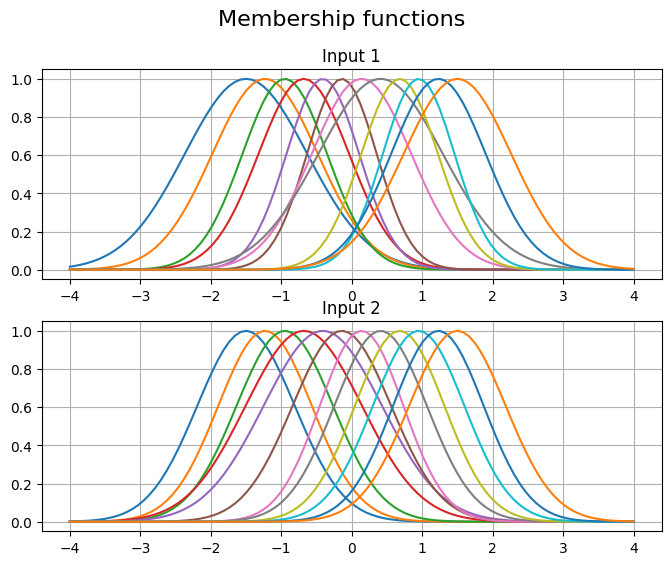

In [ ]:
net.plotmfs()

In [ ]:
history = net.fit(X_trainf2, y_trainf2,
                  epochs=600,
                  batch_size=60,
                  validation_data = (X_testf2, y_testf2) )

Epoch 1/600
900/900 [==============================] - 6s 5ms/step - loss: 0.1838 - mae: 0.3322 - mse: 0.1838 - accuracy: 2.5926e-04 - val_loss: 0.0645 - val_mae: 0.2144 - val_mse: 0.0645 - val_accuracy: 1.6667e-04
Epoch 2/600
900/900 [==============================] - 5s 5ms/step - loss: 0.0607 - mae: 0.2100 - mse: 0.0607 - accuracy: 3.3333e-04 - val_loss: 0.0568 - val_mae: 0.2049 - val_mse: 0.0568 - val_accuracy: 1.6667e-04
Epoch 3/600
900/900 [==============================] - 4s 4ms/step - loss: 0.0561 - mae: 0.2049 - mse: 0.0561 - accuracy: 3.3333e-04 - val_loss: 0.0544 - val_mae: 0.2025 - val_mse: 0.0544 - val_accuracy: 1.6667e-04
Epoch 4/600
900/900 [==============================] - 3s 4ms/step - loss: 0.0549 - mae: 0.2040 - mse: 0.0549 - accuracy: 3.3333e-04 - val_loss: 0.0543 - val_mae: 0.2025 - val_mse: 0.0543 - val_accuracy: 1.6667e-04
Epoch 5/600
900/900 [==============================] - 3s 4ms/step - loss: 0.0549 - mae: 0.2040 - mse: 0.0549 - accuracy: 3.3333e-04 - val_l

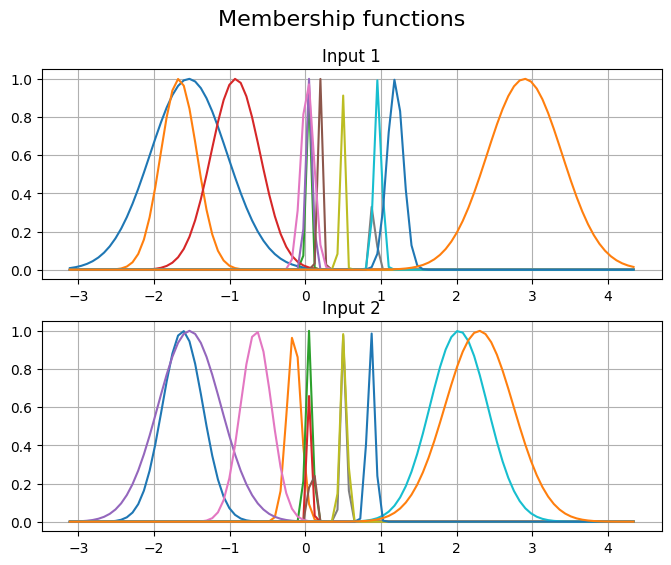

In [ ]:
net.plotmfs()

In [ ]:
y_pred=net(X_trainf2)

900/900 [==============================] - 2s 2ms/step


In [ ]:
import plotly.graph_objects as go
fig = go.Figure()
# Добавление точек True Function
fig.add_trace(go.Scatter3d(x=X_trainf2[:, 0], y=X_trainf2[:, 1], z=y_trainf2[:, 0],
                           mode='markers', marker=dict(size=1, color='blue'), name='Wave Function'))
fig.add_trace(go.Scatter3d(x=X_trainf2[:, 0], y=X_trainf2[:, 1], z=y_pred[:, 0],
                           mode='markers', marker=dict(size=2, color='red'), name='Predicted Function'))
# Настройка макета
fig.update_layout(scene=dict(xaxis_title='X1', yaxis_title='X2', zaxis_title='Values'),
                  margin=dict(l=0, r=0, b=0, t=0))
# Отображение графика
fig.show()
#plt.show()

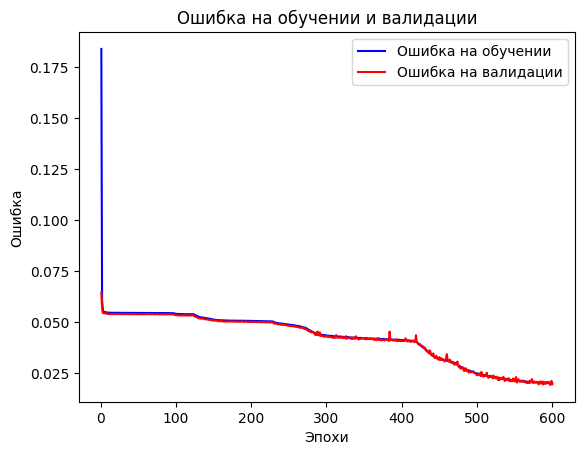

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(train_loss) + 1)
plt.figure()
plt.plot(epochs, train_loss, 'b', label='Ошибка на обучении')
plt.plot(epochs, val_loss, 'r', label='Ошибка на валидации')
plt.title('Ошибка на обучении и валидации')
plt.xlabel('Эпохи')
plt.ylabel('Ошибка')
plt.legend()
plt.show()

In [ ]:
import plotly.graph_objects as go
fig = go.Figure()
# Добавление точек True Function
fig.add_trace(go.Scatter3d(x=X_trainf2[:, 0], y=X_trainf2[:, 1], z=y_pred[:, 0],
                           mode='markers', marker=dict(size=1, color='red'), name='Predicted Function'))
# Настройка макета
fig.update_layout(scene=dict(xaxis_title='X1', yaxis_title='X2', zaxis_title='Values'),
                  margin=dict(l=0, r=0, b=0, t=0))
# Отображение графика
fig.show()
#plt.show()

In [ ]:
y_pred_test=net(X_testf2)

600/600 [==============================] - 2s 2ms/step


In [ ]:
deviations = np.std(y_testf2, ddof = 0)
print('% верно полученных точек в тестовых данных')
print(approximation_quality(deviations, y_testf2, y_pred_test))

% верно полученных точек в тестовых данных
90.51388888888889


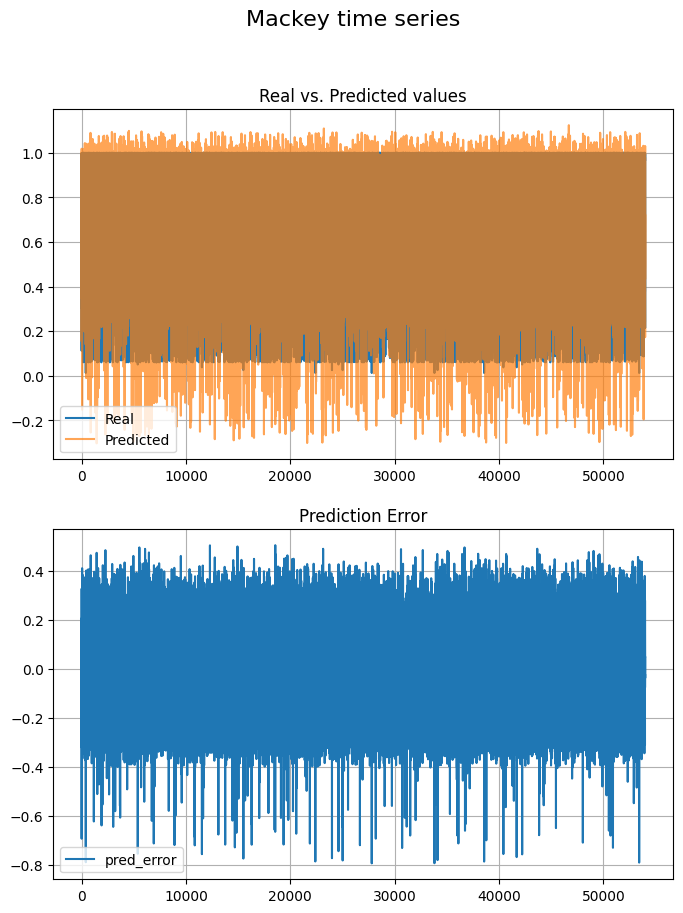

In [ ]:
f, axs = plt.subplots(2,1,figsize=(8,10))
f.suptitle('Mackey time series', size=16)
axs[0].plot(y_trainf2)
axs[0].plot(y_pred, alpha=.7)
axs[0].legend(['Real', 'Predicted'])
axs[0].grid(True)
axs[0].set_title('Real vs. Predicted values')
axs[1].plot(np.arange(y_trainf2.shape[0]), y_trainf2 - y_pred)
axs[1].legend(['pred_error'])
axs[1].grid(True)
axs[1].set_title('Prediction Error')
plt.show()

In [ ]:
def generation_point(count,a=1,b=2):
    xa = []
    i = 0
    while i < count:
        # Генерация случайных чисел с использованием нормального распределеня
        rand = np.random.normal(10, 1, 1)
        xa.extend(rand)
        i = i + 1
    # Вычисление значения функции для сгенерированных данных
    #gen=np.random.default_rng()
    #gen.integers(low=1, high=5)
    z1 = f1(xa,a,b)
    x1 = np.reshape(xa, (len(xa), 1))
    z1 = np.reshape(z1, (len(z1), 1))
    return x1, z1